In [3]:
%matplotlib inline
import librosa
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import butter, lfilter, freqz, freqs, impulse
import matplotlib.pyplot as plt
from IPython.display import Audio

In [4]:
raw, sr = librosa.load("./TestTrack.wav", sr=44100)

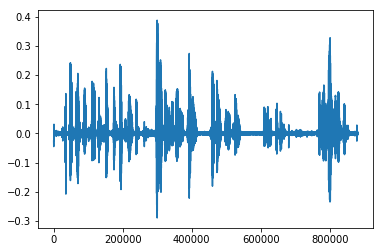

In [5]:
plt.plot(raw)

In [6]:
Audio(data=raw, rate=sr)

In [7]:
Audio(data=raw, rate=sr/2)

In [8]:
Audio(data=raw, rate=sr*2)

In [9]:
import numpy as np

In [10]:
freq = 6*100+500

In [ ]:
https://fiiir.com

In [11]:
from scipy.fft import ifft, fft
from scipy.signal import istft, stft

In [12]:
lowPassFilter = (np.arange(512) * sr / 1024 < freq).astype(float)
lowPassFilter = np.concatenate((lowPassFilter, lowPassFilter[::-1]))

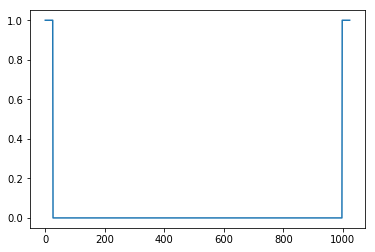

In [13]:
plt.plot(lowPassFilter)

In [14]:
filterImpulseResponse = ifft(lowPassFilter)

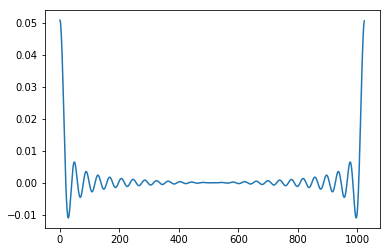

In [15]:
plt.plot(filterImpulseResponse.real)

In [16]:
def window_stack(a, stepsize=1, width=3):
    n = a.shape[0]
    return np.vstack( a[i:i+width] for i in range(0, n - width + 1, stepsize) )

In [17]:
def convolve(s, f):
    s_ = np.concatenate((np.zeros_like(f), s))
    s_ = window_stack(s, width=f.size);
    return s_ @ f[::-1]
    

In [23]:
from tqdm.auto import tqdm

In [65]:
def convolve(s, f):
    return np.fromiter(
        (
            s[max(0, i - f.size):i] @  f[::-1][-i:] 
            for i in tqdm(range(1, s.size + 1))
        ), 
        np.float
    )
        

In [67]:
filtred = convolve(raw, filterImpulseResponse.real[:512])

In [68]:
Audio(raw, rate=sr)

In [69]:
Audio(filtred, rate=sr)

In [164]:
b, a = butter(4, freq / (sr / 2), 'low', analog=False, output="ba")

In [165]:
w, h = freqz(b, a)

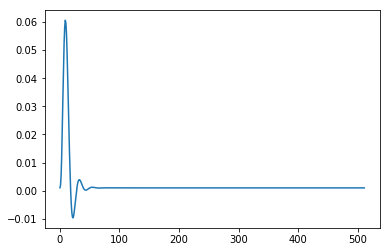

In [175]:
plt.plot(ifft(h).real)

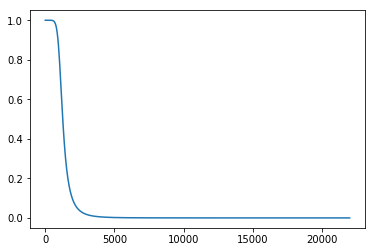

In [167]:
plt.plot(0.5*sr*w/np.pi, np.abs(h))

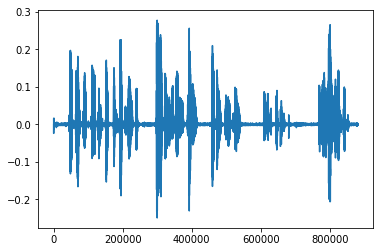

In [122]:
plt.plot(lfilter(b, a, raw))

In [73]:
Audio(lfilter(b, a, raw), rate=sr)

In [70]:
# source: https://freesound.org/people/johnnyguitar01/sounds/423712/

rawIR, sr  = librosa.load("423712__johnnyguitar01__the-knights-hall-ir.wav")

In [73]:
convolved = convolve(raw, rawIR)

In [74]:
Audio(convolved, rate=44100)

In [97]:
def karplus_strong(wavetable, n_samples):
    samples = []
    current_sample = 0
    previous_value = 0
    while len(samples) < n_samples:
        wavetable[current_sample] = 0.5 * (wavetable[current_sample] + previous_value)
        samples.append(wavetable[current_sample])
        previous_value = samples[-1]
        current_sample += 1
        current_sample = current_sample % wavetable.size
    return np.array(samples)

In [100]:
fs = 8000

wavetable_size = fs // 55 

wavetable = (2 * np.random.randint(0, 2, wavetable_size) - 1).astype(np.float)

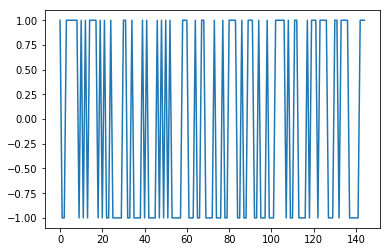

In [101]:
plt.plot(wavetable)

In [102]:
sample1 = karplus_strong(wavetable, 2 * fs)

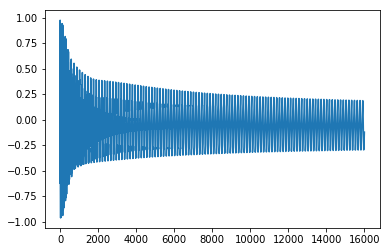

In [103]:
plt.plot(sample1)

In [104]:
Audio(sample1, rate=fs)

In [107]:
(1, 2, 3)

(1, 2, 3)